## Imports

In [95]:
# import the required packages
import numpy as np 
from numpy import sqrt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn. ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
import feature_engine.imputation as mdi
import statsmodels.api as sm
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from math import sqrt
%matplotlib inline

In [97]:
from sklearn.model_selection import GridSearchCV
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.decomposition import PCA

In [99]:
from sklearn.compose import ColumnTransformer
import plotly.express as px
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from feature_engine.encoding import OneHotEncoder
from feature_engine.imputation import EndTailImputer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from feature_engine.encoding import OneHotEncoder
from feature_engine.encoding import MeanEncoder
from sklearn.preprocessing import FunctionTransformer
from feature_engine.transformation import LogTransformer
from feature_engine.transformation import ReciprocalTransformer
from feature_engine.transformation import YeoJohnsonTransformer
from feature_engine.outliers import Winsorizer
from sklearn.preprocessing import StandardScaler
from sklearn. ensemble import RandomForestRegressor

In [101]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import scipy.cluster.hierarchy as shc  
from sklearn.cluster import AgglomerativeClustering 
from sklearn.preprocessing import StandardScaler, normalize 
from sklearn.metrics import silhouette_score 
from sklearn.linear_model import Ridge

## 1. Task 1: Supervised Learning Using Airbnb Dataset 

### 1.1 Load and Explore the data

In [105]:
# Load the full dataset
airbnb_df = pd.read_csv('listings.csv')
airbnb_df.head(10)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355
5,71903,Room 2-near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34702,103.96103,Private room,104,1,39,2019-08-15,0.38,9,346
6,71907,3rd level Jumbo room 5 near EXPO,367042,Belinda,East Region,Tampines,1.34348,103.96337,Private room,208,1,25,2019-07-25,0.25,9,172
7,241503,"Long stay at The Breezy East ""Leopard""",1017645,Bianca,East Region,Bedok,1.32304,103.91363,Private room,50,90,174,2019-05-31,1.88,4,59
8,241508,"Long stay at The Breezy East ""Plumeria""",1017645,Bianca,East Region,Bedok,1.32458,103.91163,Private room,54,90,198,2019-04-28,2.08,4,133
9,241510,"Long stay at The Breezy East ""Red Palm""",1017645,Bianca,East Region,Bedok,1.32461,103.91191,Private room,42,90,236,2019-07-31,2.53,4,147


In [107]:
airbnb_df.info

<bound method DataFrame.info of             id                                               name    host_id  \
0        49091                  COZICOMFORT LONG TERM STAY ROOM 2     266763   
1        50646                    Pleasant Room along Bukit Timah     227796   
2        56334                                        COZICOMFORT     266763   
3        71609                Ensuite Room (Room 1 & 2) near EXPO     367042   
4        71896                    B&B  Room 1 near Airport & EXPO     367042   
...        ...                                                ...        ...   
7902  38105126  Loft 2 pax near Haw Par / Pasir Panjang. Free ...  278109833   
7903  38108273                         3bedroom luxury at Orchard  238891646   
7904  38109336    [ Farrer Park ] New City Fringe CBD Mins to MRT  281448565   
7905  38110493          Cheap Master Room in Central of Singapore  243835202   
7906  38112762  Amazing room with private bathroom walk to Orc...   28788520   

      h

In [109]:
airbnb_df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,7.907000e+03,7.907000e+03,7907.000000,7907.000000,7907.000000,7907.000000,7907.000000,5149.000000,7907.000000,7907.000000
mean,2.338862e+07,9.114481e+07,1.314192,103.848787,169.332996,17.510054,12.807386,1.043669,40.607689,208.726318
std,1.016416e+07,8.190910e+07,0.030577,0.043675,340.187599,42.094616,29.707746,1.285851,65.135253,146.120034
min,4.909100e+04,2.366600e+04,1.243870,103.646560,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,1.582180e+07,2.305808e+07,1.295795,103.835825,65.000000,1.000000,0.000000,0.180000,2.000000,54.000000
50%,2.470627e+07,6.344891e+07,1.311030,103.849410,124.000000,3.000000,2.000000,0.550000,9.000000,260.000000
75%,3.234850e+07,1.553811e+08,1.322110,103.872535,199.000000,10.000000,10.000000,1.370000,48.000000,355.000000
max,3.811276e+07,2.885676e+08,1.454590,103.973420,10000.000000,1000.000000,323.000000,13.000000,274.000000,365.000000


In [111]:
airbnb_df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [113]:

#move price target to the right
cols = [col for col in airbnb_df.columns if col != 'price'] + ['price']
airbnb_df = airbnb_df[cols]


In [115]:
airbnb_df

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,price
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,180,1,2013-10-21,0.01,2,365,83
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,90,18,2014-12-26,0.28,1,365,81
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,6,20,2015-10-01,0.20,2,365,69
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,1,14,2019-08-11,0.15,9,353,206
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,1,22,2019-07-28,0.22,9,355,94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7902,38105126,Loft 2 pax near Haw Par / Pasir Panjang. Free ...,278109833,Belle,Central Region,Queenstown,1.27973,103.78751,Entire home/apt,3,0,NaN,NaN,31,61,100
7903,38108273,3bedroom luxury at Orchard,238891646,Neha,Central Region,Tanglin,1.29269,103.82623,Entire home/apt,6,0,NaN,NaN,34,365,550
7904,38109336,[ Farrer Park ] New City Fringe CBD Mins to MRT,281448565,Mindy,Central Region,Kallang,1.31286,103.85996,Private room,30,0,NaN,NaN,3,173,58
7905,38110493,Cheap Master Room in Central of Singapore,243835202,Huang,Central Region,River Valley,1.29543,103.83801,Private room,14,0,NaN,NaN,2,30,56


### 1.2 Cleanse and Transform the data

In [118]:
#Check and deal with Null values

In [120]:
airbnb_df.isnull().mean().sort_values(ascending=False)

last_review                       0.348805
reviews_per_month                 0.348805
name                              0.000253
id                                0.000000
host_id                           0.000000
host_name                         0.000000
neighbourhood_group               0.000000
neighbourhood                     0.000000
latitude                          0.000000
longitude                         0.000000
room_type                         0.000000
minimum_nights                    0.000000
number_of_reviews                 0.000000
calculated_host_listings_count    0.000000
availability_365                  0.000000
price                             0.000000
dtype: float64

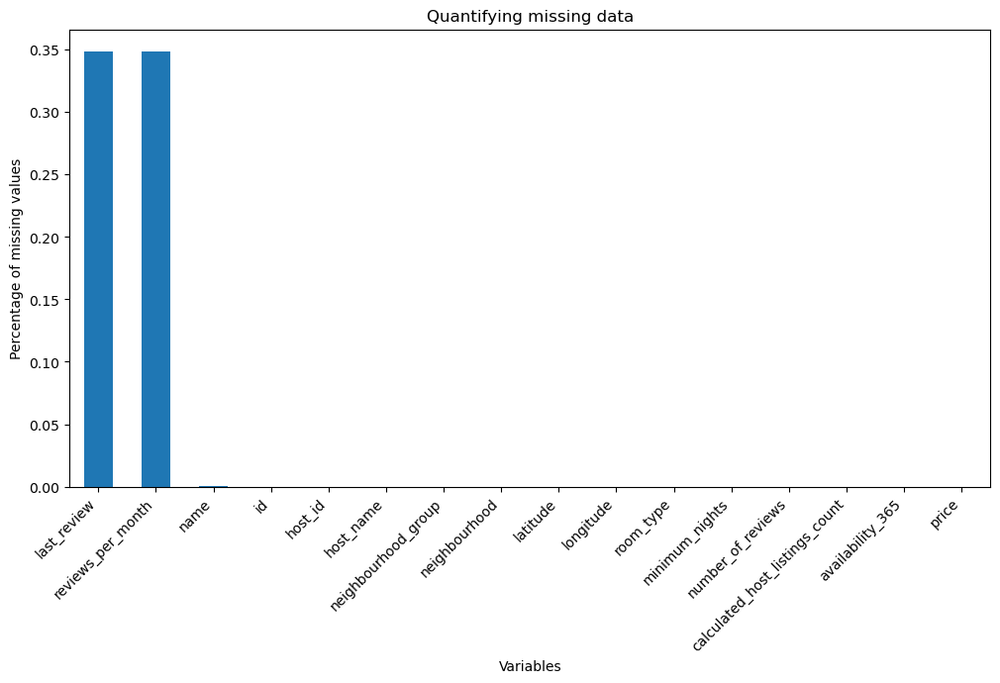

In [122]:
#shows the missing data
missing_values = airbnb_df.isnull().mean().sort_values(ascending=False)

missing_values.plot.bar(figsize=(12, 6))
plt.ylabel('Percentage of missing values')
plt.xlabel('Variables')
plt.title('Quantifying missing data')

plt.xticks(rotation=45, ha='right')  # Rotate and align labels

plt.show()

In [123]:
#drop columns + identify columns which are numerical and categorical
dropped_cols = ['id','host_id','name','last_review','host_name']
airbnb_df.drop(columns=[c for c in dropped_cols if c in airbnb_df.columns], inplace = True)
cat_cols = [c for c in airbnb_df.columns if airbnb_df[c].dtypes=='O']
num_cols = [c for c in airbnb_df.columns if airbnb_df[c].dtypes!='O']
print(airbnb_df[cat_cols])
print(airbnb_df[num_cols])


     neighbourhood_group neighbourhood        room_type
0           North Region     Woodlands     Private room
1         Central Region   Bukit Timah     Private room
2           North Region     Woodlands     Private room
3            East Region      Tampines     Private room
4            East Region      Tampines     Private room
...                  ...           ...              ...
7902      Central Region    Queenstown  Entire home/apt
7903      Central Region       Tanglin  Entire home/apt
7904      Central Region       Kallang     Private room
7905      Central Region  River Valley     Private room
7906      Central Region  River Valley     Private room

[7907 rows x 3 columns]
      latitude  longitude  minimum_nights  number_of_reviews  \
0      1.44255  103.79580             180                  1   
1      1.33235  103.78521              90                 18   
2      1.44246  103.79667               6                 20   
3      1.34541  103.95712               1      

C:\Users\sawyo\AppData\Local\Temp\ipykernel_10308\1359941687.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  airbnb_df.drop(columns=[c for c in dropped_cols if c in airbnb_df.columns], inplace = True)


In [126]:
#how i filled missing values +impute
airbnb_df['reviews_per_month'] = airbnb_df['reviews_per_month'].fillna(0)
for col in num_cols:
    airbnb_df[col] = airbnb_df[col].fillna(airbnb_df[col].median())
for col in cat_cols:
    mode_val = airbnb_df[col].mode()[0]
    airbnb_df[col] = airbnb_df[col].fillna(mode_val)

C:\Users\sawyo\AppData\Local\Temp\ipykernel_10308\143127420.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  airbnb_df['reviews_per_month'] = airbnb_df['reviews_per_month'].fillna(0)
C:\Users\sawyo\AppData\Local\Temp\ipykernel_10308\143127420.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  airbnb_df[col] = airbnb_df[col].fillna(airbnb_df[col].median())
C:\Users\sawyo\AppData\Local\Temp\ipykernel_10308\143127420.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

In [128]:
#check for missing data
airbnb_df.isnull().mean().sort_values(ascending=False)

neighbourhood_group               0.0
neighbourhood                     0.0
latitude                          0.0
longitude                         0.0
room_type                         0.0
minimum_nights                    0.0
number_of_reviews                 0.0
reviews_per_month                 0.0
calculated_host_listings_count    0.0
availability_365                  0.0
price                             0.0
dtype: float64

In [130]:
##dealing with outliers (transforming and scaling data)

In [132]:
def diagnostic_plots(airbnb_df, variable):
    
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(airbnb_df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(airbnb_df[variable], dist="norm", plot=plt)
    plt.ylabel('RM quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=airbnb_df[variable])
    plt.title('Boxplot')
    plt.show()

In [134]:
#outlier trim the price
lower = airbnb_df['price'].quantile(0.05)
upper = airbnb_df['price'].quantile(0.95)

airbnb_df = airbnb_df[(airbnb_df['price'] >= lower) & (airbnb_df['price'] <= upper)]

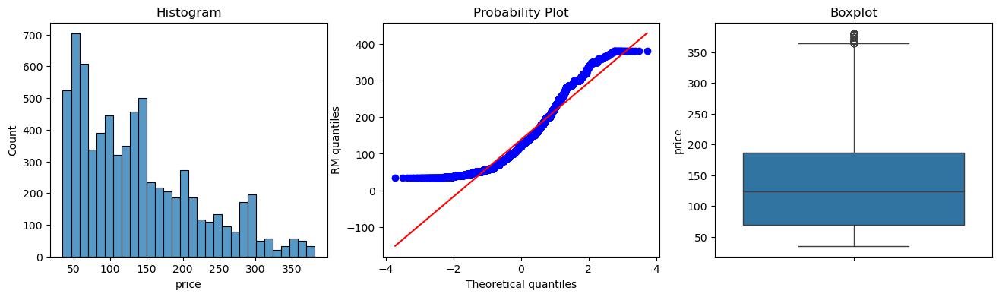

In [136]:
diagnostic_plots(airbnb_df,'price')

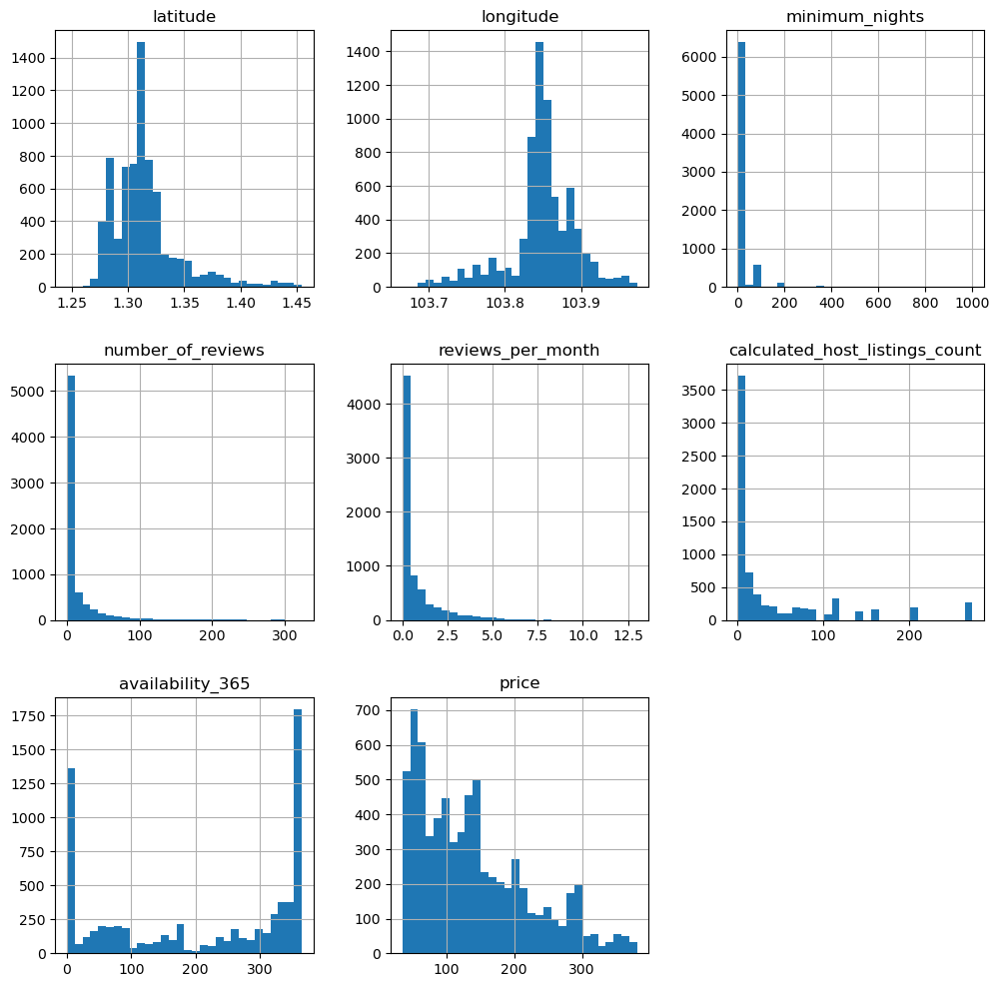

In [137]:
#how the distribution of data is rn
airbnb_df[num_cols].hist(bins=30, figsize=(12,12))
plt.show()

In [138]:
#make a train and a test sample
train_df, test_df = train_test_split(airbnb_df, test_size=0.3, random_state=42)

In [140]:
train_df.head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price
7504,Central Region,Bukit Merah,1.26569,103.81606,Entire home/apt,1,3,3.00,3,45,247
6747,East Region,Bedok,1.30903,103.91911,Private room,1,21,5.78,3,71,35
2171,Central Region,Kallang,1.31529,103.85442,Entire home/apt,3,46,1.71,1,241,137
368,Central Region,Toa Payoh,1.32930,103.85402,Private room,1,0,0.00,1,0,50
5519,Central Region,Downtown Core,1.27316,103.84511,Entire home/apt,30,0,0.00,274,296,154


In [141]:
#Save and drop target
y_train = train_df['price']
y_test = test_df['price']
train_df = train_df.drop('price', axis=1)
test_df = test_df.drop('price', axis=1)

#One-hot encode 'room_type'
if 'room_type' in train_df:
    train_df = pd.get_dummies(train_df, columns=['room_type'], drop_first=True)
    test_df = pd.get_dummies(test_df, columns=['room_type'], drop_first=True)
    # Align columns
    train_df, test_df = train_df.align(test_df, join='left', axis=1, fill_value=0)

# Add back 'price' temporarily for encoding
train_temp = train_df.copy()
train_temp['price'] = y_train

#Mean encoding (using only training data)
for col in ['neighbourhood', 'neighbourhood_group']:
    if col in train_temp.columns:
        te_map = train_temp.groupby(col)['price'].mean()
        train_df[f'{col}_te'] = train_temp[col].map(te_map)
        test_df[f'{col}_te'] = test_df[col].map(te_map)

        # Drop original categorical column
        train_df.drop(col, axis=1, inplace=True)
        test_df.drop(col, axis=1, inplace=True)


X_train = train_df
X_test = test_df

In [142]:
#feature engineering
train_df['reviews_per_avail'] = train_df['reviews_per_month'] / train_df['availability_365']

# Step 2: Replace infinities with NaN
train_df['reviews_per_avail'] = train_df['reviews_per_avail'].replace([np.inf, -np.inf], np.nan)

# Step 3: Fill missing values
train_df['reviews_per_avail'] = train_df['reviews_per_avail'].fillna(0)


# ----------------------------
# Feature engineering on test_df
# ----------------------------


test_df['reviews_per_avail'] = test_df['reviews_per_month'] / test_df['availability_365']
test_df['reviews_per_avail'] = test_df['reviews_per_avail'].replace([np.inf, -np.inf], np.nan)
test_df['reviews_per_avail'] = test_df['reviews_per_avail'].fillna(0)

In [143]:
# Feature engineering on train_df
train_df['total_price'] = y_train * train_df['availability_365']


# Feature engineering on test_df
test_df['total_price'] = y_test * test_df['availability_365']


In [144]:
#In machine learning, different data types require different preprocessing steps. Using multiple transformers lets us prepare each column in the most appropriate way before feeding them into the model.

## After transform Data

In [153]:
# Log-transform the target variable
y_train = np.log1p(y_train)
y_test = np.log1p(y_test)

# Yeo-Johnson Transform on Skewed Numerical Features
numerical_features = ['minimum_nights', 'number_of_reviews', 'reviews_per_month',
                      'calculated_host_listings_count', 'availability_365']

# Fit transformer only on train_df
yjt = YeoJohnsonTransformer(variables=numerical_features)
yjt.fit(train_df)

# Transform both train and test
train_df = yjt.transform(train_df)
test_df = yjt.transform(test_df)

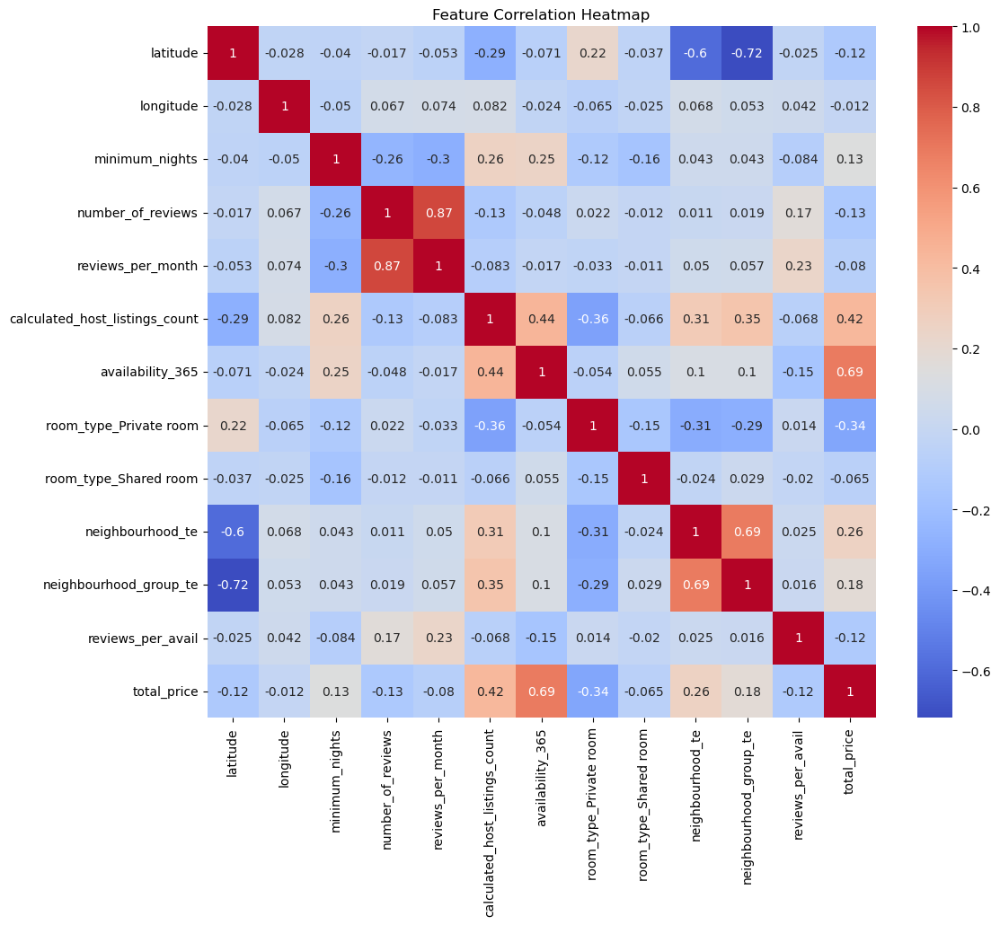

In [155]:
#show correlation
corr_matrix = train_df.corr(numeric_only=True)
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Feature Correlation Heatmap")
plt.show()

### 1.3 Build the Machine Learning Models

In [157]:
#Linear Regression

In [158]:
train_df.isnull().mean().sort_values(ascending=False)

latitude                          0.0
longitude                         0.0
minimum_nights                    0.0
number_of_reviews                 0.0
reviews_per_month                 0.0
calculated_host_listings_count    0.0
availability_365                  0.0
room_type_Private room            0.0
room_type_Shared room             0.0
neighbourhood_te                  0.0
neighbourhood_group_te            0.0
reviews_per_avail                 0.0
total_price                       0.0
dtype: float64

In [162]:
# Clean X_train and X_test to remove inf and NaN
X_train.replace([np.inf, -np.inf], np.nan, inplace=True)
X_test.replace([np.inf, -np.inf], np.nan, inplace=True)

X_train.fillna(0, inplace=True)  # or use median() instead of 0
X_test.fillna(0, inplace=True)


In [164]:
lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression()

In [166]:
print(lm.coef_)
print(lm.intercept_)

[-1.88771433e+00  2.30089484e-02 -5.08281218e-04 -2.27408651e-04
 -1.31382855e-03 -4.05431732e-04 -1.92295186e-03 -4.43925797e-01
 -6.07813947e-01  1.27836197e-03 -1.17727217e-03  6.27284475e-02
  1.64855968e-05]
4.9864862135392185


In [168]:
from numpy import expm1, sqrt
from sklearn.metrics import mean_squared_error, r2_score

# Predict in log scale
y_pred_log = lm.predict(X_test)
y_train_pred_log = lm.predict(X_train)

# Inverse transform
y_pred_actual = expm1(y_pred_log)
y_test_actual = expm1(y_test)

y_train_pred_actual = expm1(y_train_pred_log)
y_train_actual = expm1(y_train)

# Calculate RMSE
rmse_test = sqrt(mean_squared_error(y_test_actual, y_pred_actual))
rmse_train = sqrt(mean_squared_error(y_train_actual, y_train_pred_actual))

print("Train RMSE (SGD $):", rmse_train)
print("Test RMSE  (SGD $):", rmse_test)


Train RMSE (SGD $): 46.707260720673695
Test RMSE  (SGD $): 48.43393047680624


In [170]:
import statsmodels.api as sm

# Ensure X_train is all numeric (especially after encoding)
X_train_numeric = X_train.astype(float)

# Add constant (intercept term) for OLS
X_train_sm = sm.add_constant(X_train_numeric)

# Fit the OLS model
ols_model = sm.OLS(y_train, X_train_sm).fit()

# View summary
print(ols_model.summary())


                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.765
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     1246.
Date:                Mon, 04 Aug 2025   Prob (F-statistic):               0.00
Time:                        21:19:33   Log-Likelihood:                -926.62
No. Observations:                4995   AIC:                             1881.
Df Residuals:                    4981   BIC:                             1972.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [172]:
#random forest regressor

In [174]:
# Build Random Forest Model and Evaluate both training and testing accuracy
rf_reg = RandomForestRegressor(max_depth=2, random_state=1, n_estimators=40)
rf_reg.fit(X_train,y_train)

RandomForestRegressor(max_depth=2, n_estimators=40, random_state=1)

In [175]:
# Predict in log scale
train_preds_log = rf_reg.predict(X_train)
test_preds_log = rf_reg.predict(X_test)

# Inverse log1p transform to get real prices
y_train_real = np.expm1(y_train)
y_test_real = np.expm1(y_test)
train_preds_real = np.expm1(train_preds_log)
test_preds_real = np.expm1(test_preds_log)

# Compute RMSE in original price scale
train_rmse = np.sqrt(mean_squared_error(y_train_real, train_preds_real))
test_rmse = np.sqrt(mean_squared_error(y_test_real, test_preds_real))

print(f"Train RMSE ($): {train_rmse:.2f}")
print(f"Test RMSE  ($): {test_rmse:.2f}")


Train RMSE ($): 51.53
Test RMSE  ($): 52.25


### 1.4 Evaluate and Improve the Model(s) Performance

In [179]:
ridge = Ridge(alpha=1.0, solver='auto', random_state=42)
ridge.fit(X_train, y_train)

y_train_pred_log = ridge.predict(X_train)
y_test_pred_log = ridge.predict(X_test)

#Inverse transform to real prices
y_train_pred_actual = expm1(y_train_pred_log)
y_test_pred_actual = expm1(y_test_pred_log)
y_train_actual = expm1(y_train)
y_test_actual = expm1(y_test)

#Calculate RMSE
rmse_train = sqrt(mean_squared_error(y_train_actual, y_train_pred_actual))
rmse_test = sqrt(mean_squared_error(y_test_actual, y_test_pred_actual))


print("Ridge Regression Evaluation")
print("Train RMSE (SGD $):", rmse_train)
print("Test RMSE  (SGD $):", rmse_test)


Ridge Regression Evaluation
Train RMSE (SGD $): 46.63912100000511
Test RMSE  (SGD $): 48.38410299764929


In [181]:
##hypertuning

In [183]:
#GridSearch + finding best hyper parameters
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import make_scorer, mean_squared_error
from numpy import sqrt

# Custom scorer using RMSE (log scale)
rmse_scorer = make_scorer(mean_squared_error, greater_is_better=False)

# Define hyperparameter grid
param_grid = {
    'max_depth': [2, 4, 6, 8],
    'n_estimators': [20, 50, 100],
    'max_features': ['sqrt', 'log2', None] 
}

# Set up model
rf = RandomForestRegressor(random_state=1)

# Set up GridSearch
grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=5,
    scoring=rmse_scorer,
    n_jobs=-1,
    verbose=1
)

# Fit on log-transformed data
grid_search.fit(X_train, y_train)

# Best model
best_rf = grid_search.best_estimator_
print("Best parameters:", grid_search.best_params_)

# Predict and evaluate
train_preds = best_rf.predict(X_train)
test_preds = best_rf.predict(X_test)

train_rmse = sqrt(mean_squared_error(y_train, train_preds))
test_rmse = sqrt(mean_squared_error(y_test, test_preds))

print("Train RMSE (log scale):", train_rmse)
print("Test RMSE  (log scale):", test_rmse)


Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters: {'max_depth': 8, 'max_features': None, 'n_estimators': 100}
Train RMSE (log scale): 0.19004327220160197
Test RMSE  (log scale): 0.20136724020423027


### 1.5 Summarize the findings

In [185]:
#using the best hyper parameters
rf_reg_final = RandomForestRegressor(max_depth=8, n_estimators=100, max_features=None)
rf_reg_final.fit(X_train, y_train)

# Predict
y_train_pred = rf_reg_final.predict(X_train)
y_test_pred = rf_reg_final.predict(X_test)

# Inverse log1p to get real price
y_train_actual = expm1(y_train)
y_train_pred_actual = expm1(y_train_pred)
y_test_actual = expm1(y_test)
y_test_pred_actual = expm1(y_test_pred)

# Print final RMSE
print("Train RMSE (real $):", sqrt(mean_squared_error(y_train_actual, y_train_pred_actual)))
print("Test RMSE  (real $):", sqrt(mean_squared_error(y_test_actual, y_test_pred_actual)))

Train RMSE (real $): 26.117624510567236
Test RMSE  (real $): 29.093133512836765



In conclusion, Random Forest Regressor emerged as the most effective model in predicting Airbnb prices based on the given dataset. It outperformed both Linear and Ridge Regression, especially in capturing non-linear patterns and delivering more accurate price predictions. The process also highlighted the importance of proper preprocessing, log transformation of skewed targets, and the value of engineered features in improving model performance. With further tuning and refinement, model accuracy could potentially be improved even more.

## 2. Task 2: Unsupervised learning Using HR Dataset

### 2.1 Load and Explore the data

In [44]:
hr_df = pd.read_csv('hr_data.csv')
hr_df.head(10)

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0
5,58896,Analytics,region_2,Bachelor's,m,sourcing,2,31,3.0,7,0,0,85,0
6,20379,Operations,region_20,Bachelor's,f,other,1,31,3.0,5,0,0,59,0
7,16290,Operations,region_34,Master's & above,m,sourcing,1,33,3.0,6,0,0,63,0
8,73202,Analytics,region_20,Bachelor's,m,other,1,28,4.0,5,0,0,83,0
9,28911,Sales & Marketing,region_1,Master's & above,m,sourcing,1,32,5.0,5,1,0,54,0


In [45]:
hr_df.info

<bound method DataFrame.info of        employee_id         department     region         education gender  \
0            65438  Sales & Marketing   region_7  Master's & above      f   
1            65141         Operations  region_22        Bachelor's      m   
2             7513  Sales & Marketing  region_19        Bachelor's      m   
3             2542  Sales & Marketing  region_23        Bachelor's      m   
4            48945         Technology  region_26        Bachelor's      m   
...            ...                ...        ...               ...    ...   
54803         3030         Technology  region_14        Bachelor's      m   
54804        74592         Operations  region_27  Master's & above      f   
54805        13918          Analytics   region_1        Bachelor's      m   
54806        13614  Sales & Marketing   region_9               NaN      m   
54807        51526                 HR  region_22        Bachelor's      m   

      recruitment_channel  no_of_trainings 

In [46]:
hr_df.describe()

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808.000000,54808.000000,50684.000000,54808.000000,54808.000000,54808.000000,54808.000000,54808.000000
mean,39195.830627,1.253011,34.803915,3.329256,5.865512,0.351974,0.023172,63.386750,0.085170
std,22586.581449,0.609264,7.660169,1.259993,4.265094,0.477590,0.150450,13.371559,0.279137
min,1.000000,1.000000,20.000000,1.000000,1.000000,0.000000,0.000000,39.000000,0.000000
25%,19669.750000,1.000000,29.000000,3.000000,3.000000,0.000000,0.000000,51.000000,0.000000
50%,39225.500000,1.000000,33.000000,3.000000,5.000000,0.000000,0.000000,60.000000,0.000000
75%,58730.500000,1.000000,39.000000,4.000000,7.000000,1.000000,0.000000,76.000000,0.000000
max,78298.000000,10.000000,60.000000,5.000000,37.000000,1.000000,1.000000,99.000000,1.000000


In [47]:
hr_df.dtypes

employee_id               int64
department               object
region                   object
education                object
gender                   object
recruitment_channel      object
no_of_trainings           int64
age                       int64
previous_year_rating    float64
length_of_service         int64
KPIs_met >80%             int64
awards_won?               int64
avg_training_score        int64
is_promoted               int64
dtype: object

In [48]:
missing_values = hr_df.isnull().mean().sort_values(ascending=False)


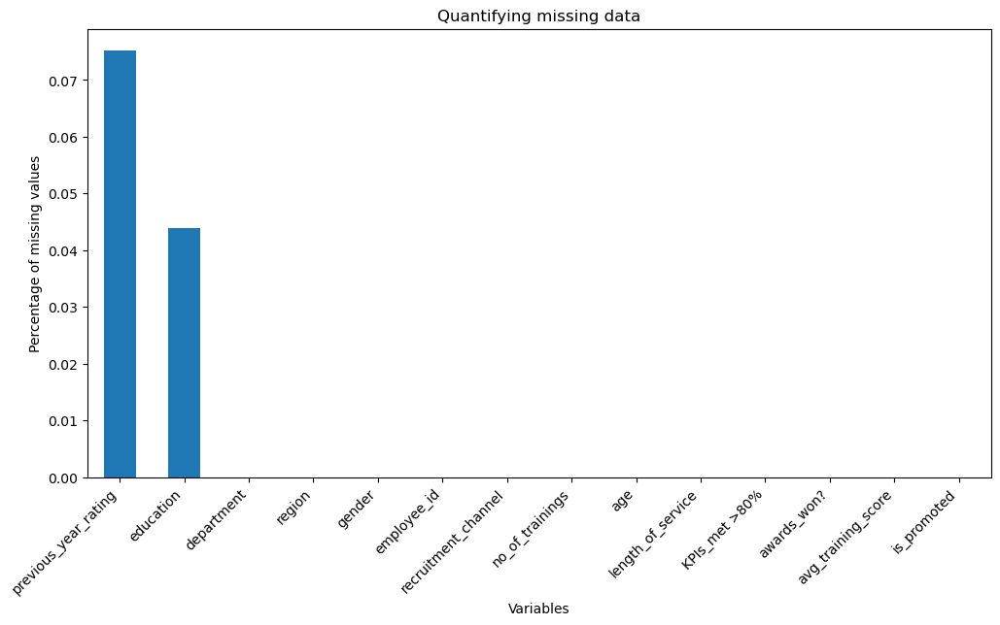

In [49]:


missing_values.plot.bar(figsize=(12, 6))
plt.ylabel('Percentage of missing values')
plt.xlabel('Variables')
plt.title('Quantifying missing data')

plt.xticks(rotation=45, ha='right')  # Rotate and align labels

plt.show()

In [50]:
cat_cols = [c for c in hr_df.columns if hr_df[c].dtypes=='O']
num_cols = [c for c in hr_df.columns if hr_df[c].dtypes!='O']
print(hr_df[cat_cols])
print(hr_df[num_cols])

              department     region         education gender  \
0      Sales & Marketing   region_7  Master's & above      f   
1             Operations  region_22        Bachelor's      m   
2      Sales & Marketing  region_19        Bachelor's      m   
3      Sales & Marketing  region_23        Bachelor's      m   
4             Technology  region_26        Bachelor's      m   
...                  ...        ...               ...    ...   
54803         Technology  region_14        Bachelor's      m   
54804         Operations  region_27  Master's & above      f   
54805          Analytics   region_1        Bachelor's      m   
54806  Sales & Marketing   region_9               NaN      m   
54807                 HR  region_22        Bachelor's      m   

      recruitment_channel  
0                sourcing  
1                   other  
2                sourcing  
3                   other  
4                   other  
...                   ...  
54803            sourcing  
54804  

### 2.2 Cleanse and Transform the data

In [51]:
# Imputers

In [52]:
#education imputer
dropped_cols = ['employee_id']
hr_df.drop(columns=[c for c in dropped_cols if c in hr_df.columns], inplace = True)
mode_imputer = mdi.CategoricalImputer(variables=['education'], imputation_method = 'frequent')

mode_imputer.fit(hr_df)
hr_df = mode_imputer.transform(hr_df)

In [53]:


imputer = EndTailImputer(imputation_method='iqr', tail='right', fold =1.5, 
                         variables=['previous_year_rating'])
imputer.fit(hr_df)
hr_df = imputer.transform(hr_df)

In [54]:
hr_df.isnull().mean().sort_values(ascending=False)

department              0.0
region                  0.0
education               0.0
gender                  0.0
recruitment_channel     0.0
no_of_trainings         0.0
age                     0.0
previous_year_rating    0.0
length_of_service       0.0
KPIs_met >80%           0.0
awards_won?             0.0
avg_training_score      0.0
is_promoted             0.0
dtype: float64

In [55]:
#encoders

In [56]:
hr_df.nunique()

department               9
region                  34
education                3
gender                   2
recruitment_channel      3
no_of_trainings         10
age                     41
previous_year_rating     6
length_of_service       35
KPIs_met >80%            2
awards_won?              2
avg_training_score      61
is_promoted              2
dtype: int64

In [57]:
ohe_encoder = OneHotEncoder(variables=cat_cols, drop_last=True)
ohe_encoder.fit(hr_df)
hr_df = ohe_encoder.transform(hr_df)

In [58]:
print(hr_df)

       no_of_trainings  age  previous_year_rating  length_of_service  \
0                    1   35                   5.0                  8   
1                    1   30                   5.0                  4   
2                    1   34                   3.0                  7   
3                    2   39                   1.0                 10   
4                    1   45                   3.0                  2   
...                ...  ...                   ...                ...   
54803                1   48                   3.0                 17   
54804                1   37                   2.0                  6   
54805                1   27                   5.0                  3   
54806                1   29                   1.0                  2   
54807                1   27                   1.0                  5   

       KPIs_met >80%  awards_won?  avg_training_score  is_promoted  \
0                  1            0                  49            

In [59]:
hr_df['avg_score_per_training'] = hr_df['avg_training_score'] / (hr_df['no_of_trainings'] + 1)


In [60]:
hr_df['training_impact'] = hr_df['no_of_trainings'] * hr_df['avg_training_score']


In [61]:
# Step 1: Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(hr_df)

# Step 2: PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)


### 2.3 Build the Clustering Model

In [62]:
kmeans = KMeans(n_clusters=3, n_init=20, max_iter=300, random_state=1)

In [63]:
kmeans.fit(X_pca)

KMeans(n_clusters=3, n_init=20, random_state=1)

In [64]:
y_pred = kmeans.predict(X_pca)

In [65]:
kmeans.inertia_

111729.2735969018

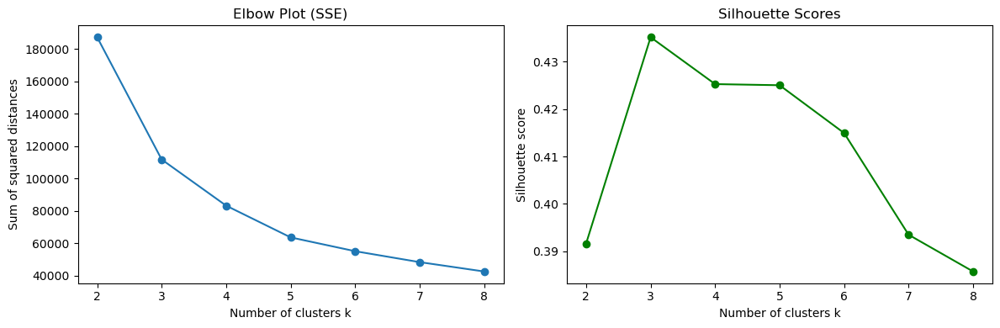

In [66]:
# Step 3: Elbow and Silhouette Plot
Ks = range(2, 9)
sse = []
sil_scores = []

for k in Ks:
    km = KMeans(n_clusters=k, n_init=20, max_iter=300, random_state=1)
    labels = km.fit_predict(X_pca)
    sse.append(km.inertia_)  # Correct: SSE based on PCA of scaled data
    sil_scores.append(silhouette_score(X_pca, labels))

# Step 4: Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

# Elbow plot
ax1.plot(Ks, sse, 'o-')
ax1.set_title('Elbow Plot (SSE)')
ax1.set_xlabel('Number of clusters k')
ax1.set_ylabel('Sum of squared distances')

# Silhouette plot
ax2.plot(Ks, sil_scores, 'o-', color='green')
ax2.set_title('Silhouette Scores')
ax2.set_xlabel('Number of clusters k')
ax2.set_ylabel('Silhouette score')

plt.tight_layout()
plt.show()

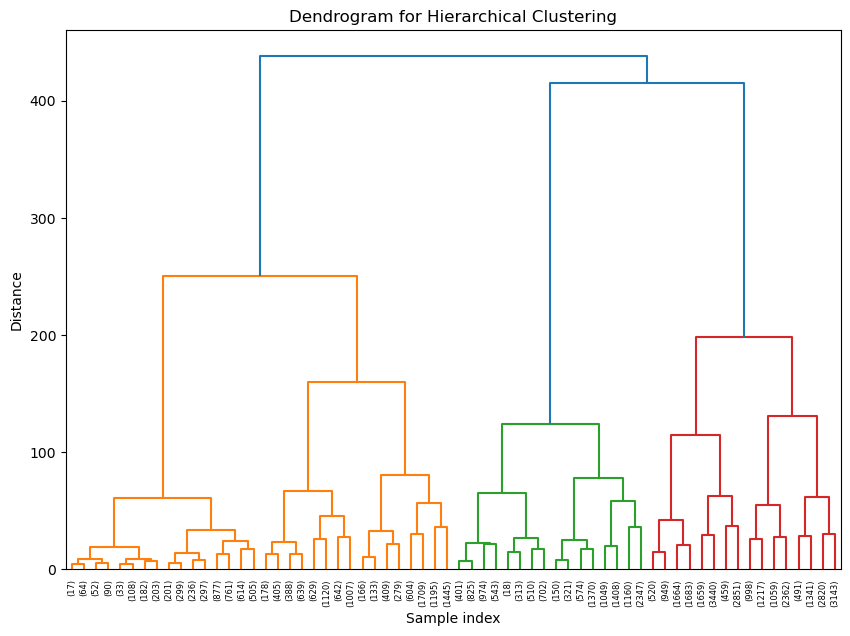

Agglomerative silhouette (k=2): 0.33876991649572286


In [67]:
# --- Hierarchical Clustering ---
from scipy.cluster.hierarchy import linkage, dendrogram
linked = linkage(X_pca, method='ward')
plt.figure(figsize=(10, 7))
dendrogram(linked, truncate_mode='level', p=5)
plt.title('Dendrogram for Hierarchical Clustering')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()

# --- Fit Agglomerative Clustering ---
n_clusters = 2
hc = AgglomerativeClustering(
    n_clusters=n_clusters,
)

labels_hc = hc.fit_predict(X_pca)

# --- Evaluate with Silhouette Score ---
sil_hc = silhouette_score(X_pca, labels_hc)
print(f"Agglomerative silhouette (k={n_clusters}):", sil_hc)


### 2.4 Evaluate and Improve the Model(s) Performance

In [68]:

#improvement for k-means
# Step 1: Run PCA with 3 components
pca = PCA(n_components=3)
X_pca_3d = pca.fit_transform(X_scaled)

# Step 2: Fit KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
labels = kmeans.fit_predict(X_pca_3d)

# Step 3: Create a DataFrame for Plotly
pca_df = pd.DataFrame(X_pca_3d, columns=['PC1', 'PC2', 'PC3'])
pca_df['Cluster'] = labels.astype(str)  # convert to string for categorical coloring

# Step 4: Plot using Plotly
fig = px.scatter_3d(pca_df, x='PC1', y='PC2', z='PC3',
                    color='Cluster',
                    title="3D PCA Cluster Visualization (Interactive)",
                    opacity=0.7)

fig.update_traces(marker=dict(size=5))
fig.show()


In [69]:
#improvement for clustering
# Build Agglomerative Clustering model with number of clusters set as 3
ac3 = AgglomerativeClustering(n_clusters = 3)
ac3

AgglomerativeClustering(n_clusters=3)

In [70]:
# Fit the model to the data and predict the clusters
ac3.fit_predict(X_pca)

array([0, 1, 1, ..., 2, 1, 1])

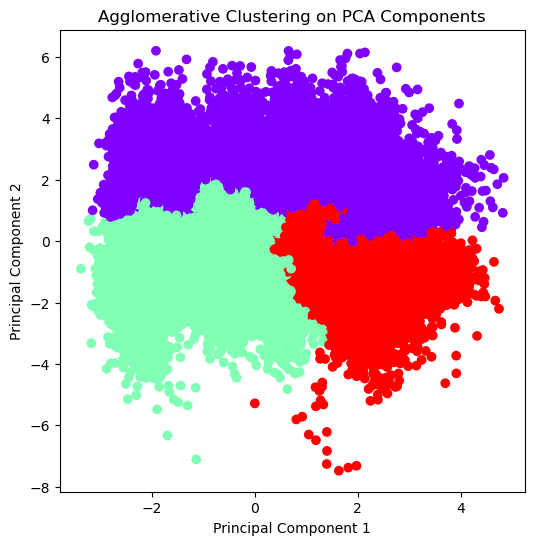

In [71]:
# Visualize the Three Clusters
plt.figure(figsize =(6, 6)) 
plt.scatter(X_pca[:,0], X_pca[:,1], 
            c = ac3.fit_predict(X_pca), cmap ='rainbow') 
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Agglomerative Clustering on PCA Components')
plt.show() 

In [72]:
ac3.n_clusters_

3

In [73]:
from sklearn.metrics import silhouette_score 
silhouette_score(X_pca, ac3.labels_)

np.float64(0.38579321448174847)

In [74]:
k_range = range(2,6)
silhouette_scores =[]

for i in k_range:
    ac_i = AgglomerativeClustering(n_clusters = i,linkage='ward')
    silhouette_scores.append(silhouette_score(X_pca, ac_i.fit_predict(X_pca)))

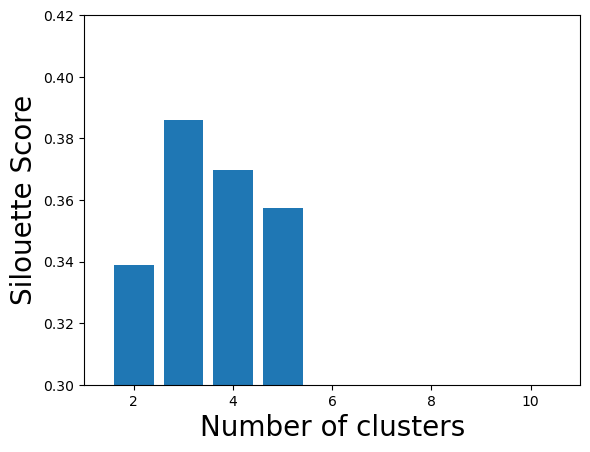

In [75]:
plt.bar(k_range, silhouette_scores) 
plt.xlabel('Number of clusters', fontsize = 20) 
plt.ylabel('Silouette Score', fontsize = 20)
plt.axis([1, 11, 0.3, 0.42])
plt.show() 

In [76]:
ac3 = AgglomerativeClustering(n_clusters = 3)
ac3

AgglomerativeClustering(n_clusters=3)

In [77]:
clustering_best = ac3.fit_predict(X_pca)

In [78]:
silhouette_score(X_pca, ac3.fit_predict(X_pca))

np.float64(0.38579321448174847)

### 2.5 Summarise and Intepret

In [83]:
hr_df['kmeans_cluster'] = labels
hr_df['agg_cluster'] = clustering_best

In [94]:
columns_summarise = ['avg_training_score','is_promoted','previous_year_rating','awards_won?','length_of_service','avg_training_score']

In [95]:
kmeans_summary = hr_df.groupby('kmeans_cluster')[columns_summarise].mean().round(3)
print("kmeans summary: ")
display(kmeans_summary)

agg_summary = hr_df.groupby('agg_cluster')[columns_summarise].mean().round(3)
print("agglomerative summary: ")
display(agg_summary)

kmeans summary: 


,avg_training_score,is_promoted,previous_year_rating,awards_won?,length_of_service,avg_training_score
kmeans_cluster,,,,,,
0,76.783,0.153,3.555,0.039,6.057,76.783
1,53.544,0.045,3.456,0.014,5.940,53.544
2,71.628,0.081,3.489,0.022,5.027,71.628


agglomerative summary: 


,avg_training_score,is_promoted,previous_year_rating,awards_won?,length_of_service,avg_training_score
agg_cluster,,,,,,
0,65.544,0.100,3.339,0.023,8.832,65.544
1,54.602,0.050,3.496,0.016,4.899,54.602
2,79.238,0.141,3.675,0.038,4.272,79.238


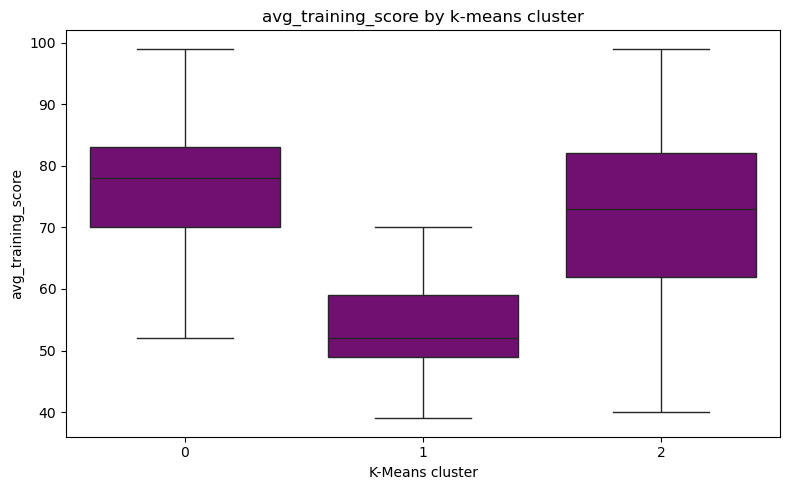

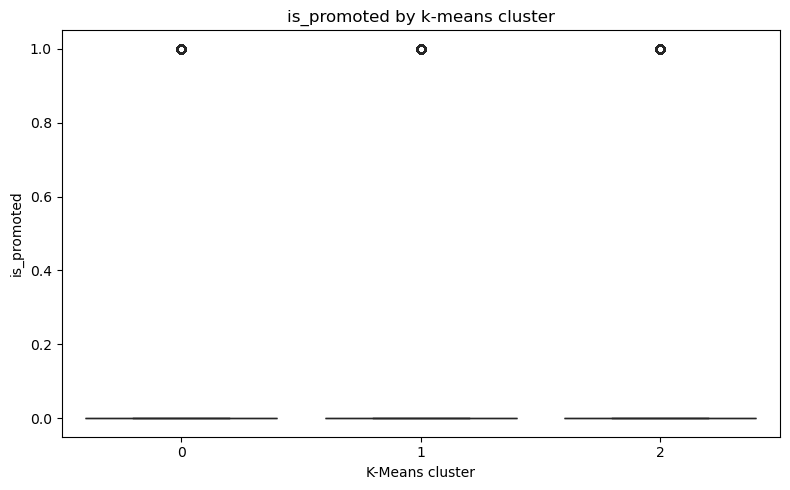

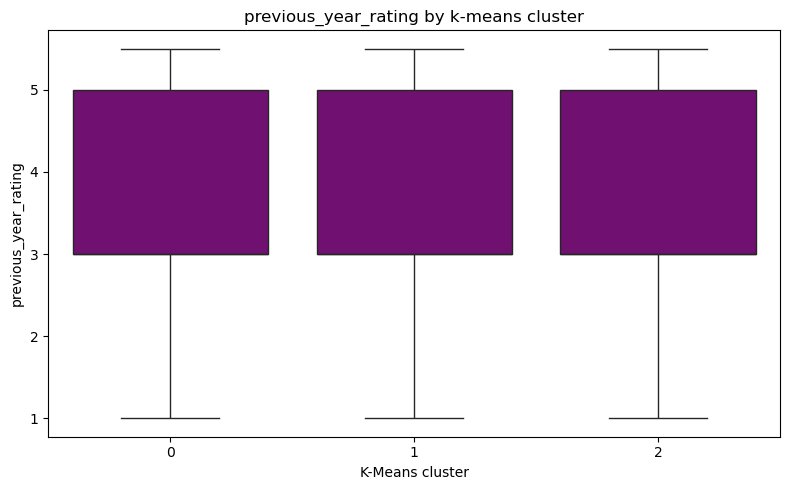

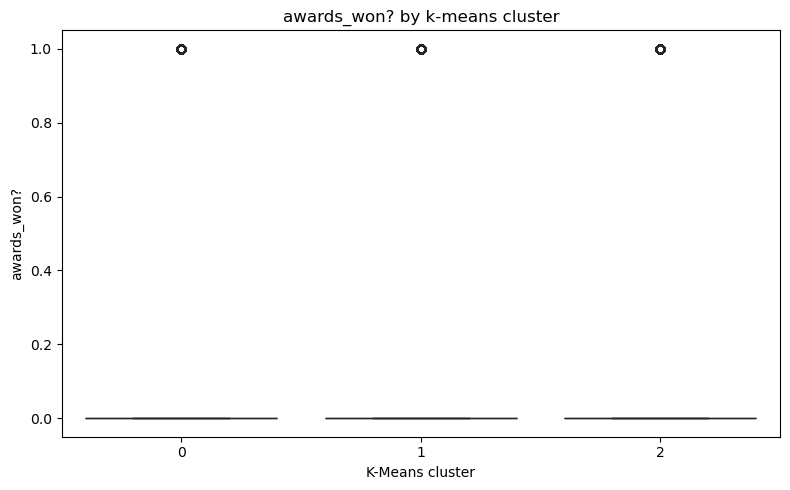

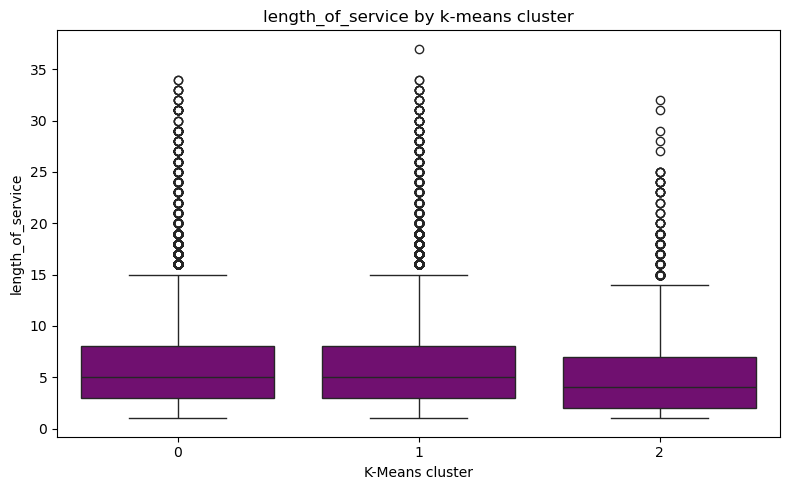

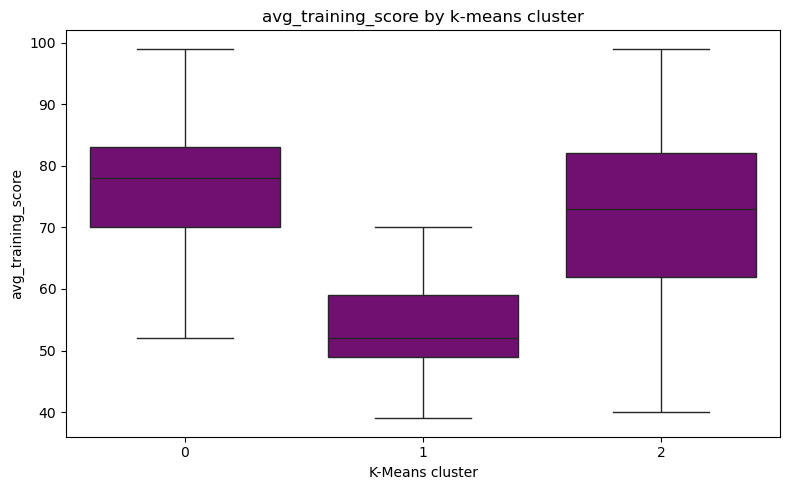

In [96]:
for column in columns_summarise:
    plt.figure(figsize=(8,5))
    sns.boxplot(
        x = 'kmeans_cluster',
        y=column,
        data= hr_df,
        color = 'purple'
    )
    plt.title(f'{column} by k-means cluster')
    plt.xlabel('K-Means cluster')
    plt.ylabel(column)
    plt.tight_layout()
    plt.show()

The boxplot illustrates the distribution of "previous_year_rating" across three KMeans clusters. Cluster 0 shows high and consistent ratings, indicating that employees in this group are likely high performers with strong promotion potential. Cluster 1, on the other hand, has relatively lower ratings, suggesting these employees may have lower performance, training scores, or a reduced likelihood of promotion. Cluster 2 shows a more varied distribution, with a mix of higher and lower ratings, representing employees who may have been in their roles for some time but could benefit from additional training or a change in position to improve their performance. Overall, the differences between the clusters are subtle, suggesting that the "previous_year_rating" may not be a strong differentiator for employee performance across these groups.

# Machine Learning Assignment Report

## Task 1 Summary
Task 1 focused on developing a predictive model to estimate Airbnb rental prices in Singapore using listings.csv. The goal was to build models that could accurately predict the price of a listing based on the available structured data.  For the data exploration part, it was observed that the price variable showed a strong right-skewed distribution, with most listings priced under $100 and a long tail of high-priced luxury properties.I then imputed all the missing values in the columns and trimmed the outliers of the "price" column". To stabilize variance and normalize the distribution, a log transformation using np.log1p() was applied to the price column. This transformation helped the models learn better relationships during training and improved overall predictive performance. I then used train_test_split to split the train data and test data. I did this step first because i wanted to prevent data leakage.

Next,to prepare the dataset for modeling, categorical variables such as room_type were one-hot encoded, while categorical features like neighbourhood were transformed using mean encoding based on training data only—this was done to avoid data leakage during evaluation. The dataset was then split into training and test sets, and the models were trained on the log-transformed target. Three models were developed and compared: Linear Regression, Ridge Regression , and Random Forest Regressor . Each model was evaluated using RMSE (Root Mean Squared Error) computed on the original price scale by inverse-transforming the predictions using np.expm1().

Before improvement and evaluation stage, my Linear Regression model Train and Test RMSE was 46.707 and 48.434  respectively. My random forest regressor model train and test RMSE was 51.53 and 52.25 
After improvement and evaluation stage, my improved Ridge Regression model train and test RMSE is 46.639 and 48.384. I then used GridSearch and then found the best hyperparameters for my random forest model. After applying the best parameters, my train and test rmse was 26.118 and 29.093. Since my train score was lesser than the test score, this shows that it is generalizing reasonably well to new data.
In conclusion, Random Forest Regressor emerged as the most effective model in predicting Airbnb prices based on the given dataset. It outperformed both Linear and Ridge Regression, especially in capturing non-linear patterns and delivering more accurate price predictions. The process also highlighted the importance of proper preprocessing, log transformation of skewed targets, and the value of engineered features in improving model performance. With further tuning and refinement, model accuracy could potentially be improved even more.

## Task 1 Report
#### Problem Understanding
The goal of this assignment is to build a supervised machine learning model that can accurately predict Airbnb rental prices using listings.csv . It can help hosts set competitive prices, support pricing strategy for marketing teams, and provide transparency for users planning trips. However, rental price prediction is very complex due to the wide range of influencing factors such as location, room type, availability.
In this assignment, I built 2 models, the Linear Regression model and the Random Forest Regression model.
#### Data Exploration
Listings.csv contains 7907 rows and contains numerical data such as minimum_nights and price and categorical data such as name and room_type.
Firstly, I entered all the necessary imports under the import section.
Next, I loaded the whole dataset using .read_csv. I then showed the info to view the content of the datasets. I then moved the price columns to the right of the dataset.
#### Data Cleansing and Transformation
First step I took for data cleansing was to use the isnull.mean to view whether my dataset contained any missing or null data. Next I plotted a Quantifying missing data graph. It showed me that 3 columns (“last_review”,”reviews_per_month”,”name”) had some missing or null values. This tells me to take action to remove these null values. Next, I dropped the columns that will not be of any help to help predict the rental prices like “id” , “host_id” and so on. Next was to group the categorical columns and numerical columns.
For the next step, I used the median imputers to fill in missing data in the numerical columns, used mode imputers to fill in missing data in the categorical columns. For the null values inside the ‘reviews_per_month’, I filled in the null values with the value 0. Next step, I went to check whether there was still any missing data using the .isnull().mean() function.  The main goal of this step was to make sure that the data was being cleaned out and no null values would appear in the codes below as null values would likely result in the failure of model.
For handling of outliers, I first defined a new function called diagnostics_plot. The function basically takes in the input of the dataframe and the corresponding variable input. It will print the histogram, Q-Q and a boxplot. I then trimmed the values of column ‘price’ higher than the 95th quantile and below the 5th quantile. I then called the function and viewed  the newly trimmed ‘price’ column. The reason for these actions was because extreme values that deviate significantly from other data points (outliers) can distort statistical analyses, machine learning models, and predictions. Trimming helps remove these anomalies to avoid bias in your model's performance.
I showed the current distribution of data on a histogram for future references.
For this step, I made a train test split. The point of this step was to take a safety precaution and separate the train sample and the test sample and make sure encoding and transformation of data would not cause data leakage.

y_train = train_df['price']
y_test = test_df['price']
train_df = train_df.drop('price', axis=1)
test_df = test_df.drop('price', axis=1)
The reason was to separate ‘price’  from the feature variables in both the training and testing datasets. The target variable is saved in y_train and y_test from the training and test sets, respectively, while the price column is dropped from train_df and test_df. This is done because machine learning models are trained to predict the target variable using the feature variables, and including the target variable in the feature set would lead to data leakage. By performing this separation, the model is trained only on the features, ensuring that the target variable remains unseen during the training process, which helps to build a proper predictive model.
Next, I encoded the ‘room_type’ using the one hot encode method. For ‘neighbourhood’ and ‘neighbourhood_group’, I encoded using the mean encoding method. Firstly, I had to temporarily add the ‘price’ column back  because at first, the price column is dropped from train_df when separating the target variable from the features. However, to perform mean encoding, the model needs the price values to calculate the mean price per category in the categorical columns.
I then performed feature engineering and created ‘reviews_per_avail’ and ‘total_price’ which are both applied to both the train_df and test_df. For the ‘reviews_per_avail’ , I had to replace infinity values with Nan and then replace the Nan values with 0 because the formula consists of the step of dividing by ‘availability_365’ and that column contains 0. And when numbers are divided by 0 , the value is inf.
Now is the time to transform data. I performed log transformation on my target variable which is  ‘price’ and performed Yeo-Johnson Transformation on skewed looking numerical columns. 
#### Correlation Analysis
The correlation heatmap reveals several important relationships between features in the dataset. Notably, there is a strong negative correlation between neighbourhood_te and latitude (-0.72), indicating that certain neighbourhoods tend to be located at lower latitudes. There is also a very strong positive correlation between reviews_per_month and number_of_reviews (0.87), suggesting that listings with more reviews receive more reviews per month. Room types, particularly shared rooms, show a strong positive correlation with neighbourhood_group_te (0.69), pointing to specific neighbourhoods offering more shared accommodations. These patterns highlight how room types, neighbourhood locations, and price 
#### model (pre-improved)
I started the process of building the linear regression model begins by training the model using the LinearRegression class from scikit-learn, where the training data (X_train and y_train) is used to fit the model. After the model is trained, its coefficients and intercept are extracted, which define the linear equation. Predictions are made for both the training and test datasets, but since the target variable was log-transformed, the predictions are also in the log scale. To make these predictions interpretable, an inverse transformation is applied using the exp1 function to bring the values back to the original scale. The model's performance is then evaluated using the RMSE, which is calculated by comparing the predicted values to the actual values. The train and test RMSE was 46.707 and 48.434 respectively.
I started the process of building the Random Forest Regressor model begins by training the model using the RandomForestRegressor class from scikit-learn, where the training data (X_train and y_train) is used to fit the model. After the model is trained, predictions are made for both the training and test datasets, but since the target variable was log-transformed, the predictions are also in the log scale. To make these predictions interpretable, an inverse transformation is applied using the np.exp function to bring the values back to the original scale. The model's performance is then evaluated using RMSE, which is calculated by comparing the predicted values to the actual values. The train and test RMSE were 51.53 and 52.25 respectively.
#### model(improved)
I created the Ridge regression model as an improvement to the linear regression model. The model is trained on the training data (X_train, y_train), and predictions are made on both the training and test sets. Since the target variable was log-transformed before training, the predictions are also in the log scale, so the inverse transformation is applied to convert the predicted and actual values back to their original scale. The model's performance is then evaluated by calculating the Root Mean Squared Error (RMSE) for both the training and test sets, which measures the difference between predicted and actual values. Train and test RMSE were 46.639 and 48.384 respectively.
In order to improve the RMSE score of the random forest regression model, I performed the gridsearchcv for hyperparameter tuning. This process helps improve model accuracy by selecting the best combination of hyperparameters based on the RMSE metric, ultimately leading to better predictions on both the training and test datasets. The best parameters given were max_depth of 8 and max_features None and n_estimators of 100. I then applied these parameters and got the following train rmse and test rmse after inverse transformation. Train RMSE was 26.118 while test RMSE was 29.093. 
#### Performance analysis
In conclusion, Random Forest Regressor emerged as the most effective model in predicting Airbnb prices based on the given dataset. It outperformed both Linear and Ridge Regression, especially in capturing non-linear patterns and delivering more accurate price predictions. The process also highlighted the importance of proper preprocessing, log transformation of skewed targets, and the value of engineered features in improving model performance. With further tuning and refinement, model accuracy could potentially be improved even more.


## Task 2 Summary
For Task 2 of your Machine Learning assignment, the focus was on applying unsupervised learning techniques to the Human Resource (HR) dataset to identify meaningful groupings of employees. The HR dataset included various attributes such as employee age, education level, performance metrics, and promotion status. The first step in the task involved a thorough exploration of the dataset, using both statistical methods and visualizations to understand the data distribution, check for missing values, and detect outliers. Missing values were handled by imputation, and categorical variables were transformed into numerical values through encoding like one-hot encoding.

The next step in the process was to build clustering models using two different techniques K-means clustering and Hierarchical clustering. K-means clustering divides the dataset into distinct clusters based on a specified number of groups, which requires selecting the optimal number of clusters. To do this, various methods were employed, including the Elbow Method and the Silhouette Score, to evaluate the performance of the K-means model and determine the ideal number of clusters. Hierarchical clustering, on the other hand, builds a dendrogram that does not require specifying the number of clusters in advance. By examining the dendrogram, the number of clusters was selected, and the resulting groups were analyzed for their relevance.

After applying both clustering algorithms, the next step was to evaluate their performance. For K-means clustering, metrics such as the Sum of Squared Errors and Silhouette Scores were used to assess how well the model performed in separating the data. Higher Silhouette Scores indicated well-defined clusters. For Hierarchical clustering, the dendrogram was examined to assess how employees were grouped at different levels, and the distance metrics used in the algorithm were tested to evaluate the model’s accuracy. Both models were also visually assessed using 2D and 3D plots to help understand how the clusters formed.

When comparing the two models, K-means clustering emerged as the preferred choice for this dataset.  The silhouette score of the K-means clustering model which is 0.435 came to become higher than the silhouette score of the hierarchical clustering which is 0.39. The higher the silhouette score, the better the clustering model.

The boxplot illustrates the distribution of "previous_year_rating" across three KMeans clusters. Cluster 0 shows high and consistent ratings, indicating that employees in this group are likely high performers with strong promotion potential. Cluster 1, on the other hand, has relatively lower ratings, suggesting these employees may have lower performance, training scores, or a reduced likelihood of promotion. Cluster 2 shows a more varied distribution, with a mix of higher and lower ratings, representing employees who may have been in their roles for some time but could benefit from additional training or a change in position to improve their performance. Overall, the differences between the clusters are subtle, suggesting that the "previous_year_rating" may not be a strong differentiator for employee performance across these groups. 

In conclusion, Task 2 demonstrated how unsupervised learning, particularly clustering algorithms, could be used to gain valuable insights from HR data. The K-means model proved to be the most effective method for this dataset, as it provided well-defined clusters that were easy to interpret. This analysis could assist HR in making data-driven decisions about promotions and identifying patterns in employee performance. Future improvements to this analysis could include experimenting with other clustering algorithms or incorporating more domain-specific features to refine the clusters and make the results even more actionable.

## Task 2 Report
#### Problem Understanding
The goal of this task is to use machine learning techniques to predict which employees are most likely to be promoted within an organisation. By utilising a dataset that includes employee demographics, performance metrics, training records, and other relevant information, the task aims to identify patterns and insights that can be used to predict the likelihood of promotion. The dataset includes both numerical and categorical features, such as age, years of service, performance ratings, and training scores, with the target variable being is_promoted (1 if promoted, 0 otherwise). Understanding these patterns can help HR departments make data-driven decisions in the promotion process, leading to more efficient and fair promotions.
#### Data Exploration and Manipulation on numerical data
First I input the data and saved it as a Pandas Dataframe named hr_df.
Next, I went to plot a Quantifying missing data graph to check for any missing values in the dataset. The bar chart then shows me that ‘previous_year_rating’ and ‘education’ had missing values. I then grouped the numerical columns and the categorical columns. After that , I went ahead to drop the columns that would not contribute to the goal of this assignment which will be ‘employee_id’ as it is a unique identifier for each employee and serves no purpose.
Next I used a mode imputer to impute all the variables inside ‘education’ and used a End tail imputer to impute all missing variables inside ‘previous_year_rating’. After that I went ahead to once again check for null values. Once I made sure there were no null values next , I am going to move on with the encoding of data.
For encoding, I applied the One hot encoder to all the categorical columns. For each unique category, a new binary column is created.( examples are education_Bachelor’s)
Next comes feature engineering, I created 2 new columns. ‘avg_score_per_training’ and ‘training_impact’. T he purpose of feature engineering is to improve the performance of the model by providing it with more informative, relevant, and well-structured data.
Next, I used the standard scaler and the pca. Using StandardScaler followed by PCA is a powerful combination for improving machine learning models. StandardScaler standardizes the features by removing their mean and scaling them to unit variance, ensuring that all features contribute equally to the model, especially when features have different scales. This is important because many machine learning algorithms, including PCA, are sensitive to the scale of the data. PCA, on the other hand, reduces the dimensionality of the data by identifying the directions (principal components) that capture the most variance, helping to eliminate multicollinearity and redundant features. By standardizing the data first, PCA can more effectively identify these components without being biased by the scale of individual features. This combination allows for better model performance, more efficient learning, and enhanced interpretation by focusing on the most important patterns in the data while reducing noise and computational complexity.
#### K-means clustering
Once the data is ready, the next crucial step is to determine the number of clusters (K). I first used this method called the Elbow Method, where I plot the Sum of Squared Errors (SSE) against different values of K. The point where the curve starts to flatten ,forming an elbow shape, is typically considered the optimal number of clusters, as adding more clusters beyond that point does not significantly reduce the SSE. Alternatively, the Silhouette Score, which measures how well-separated the clusters are, can also help determine the best K. A higher Silhouette Score indicates better-defined clusters. In this case it can be observed that the best number of clusters is 3.
#### Hierarchical clustering
For Hierarchical Clustering, I decided to approach it with the agglomerative method. Agglomerative is more commonly used and begins by treating each data point as its own cluster. It then iteratively merges the closest clusters based on a similarity measure (typically Euclidean distance) until all data points are grouped into a single cluster. On the other hand, divisive clustering starts with all points in a single cluster and recursively splits the data until each point is its own cluster. I then visualised the data using a dendrogram. A dendrogram is a tree-like diagram that shows how clusters are merged at each step. The height of each merge represents the distance or dissimilarity between the clusters. By cutting the dendrogram at a specific height, i can decide how many clusters to form based on where the largest merges occur, which in this case is also 3.
#### Evaluate and compare the models
For the improvement of my kmeans model, I used PCA as an improvement to my K-means model to enhance the clustering process and make the results more interpretable. By reducing the dataset to three principal components, PCA simplifies the data and captures the most important variance, which helps the K-means algorithm identify clearer clusters. High-dimensional data can complicate clustering, leading to less accurate results, so dimensionality reduction makes the task more manageable. Additionally, by visualizing the clusters in a 3D scatter plot, I can gain insights into the cluster separation. The reduced dimensions also improve computational efficiency, allowing K-means to run faster. Overall, PCA helps improve cluster separation, reduces complexity, and offers a more intuitive understanding of the clustering results.
For my agglomerative clustering, I saw that the dendrogram used3 so I decided to input 3 inside my agglomerative clustering. I used agglomerative clustering in my model improvement to perform hierarchical clustering, which starts with each data point as its own cluster and iteratively merges the closest clusters. This method allows me to capture the underlying patterns and relationships in the data without predefining the number of clusters. By applying PCA me reduced the data dimensionality while maximising variance, which helps in more effective clustering. The silhouette score was employed to evaluate the quality of the clusters by measuring how well-separated and cohesive they are. By calculating silhouette scores for different cluster numbers, I ensured that three clusters were the most optimal. Lastly, visualizing the distribution of each cluster's data using boxplots helped in further validating the clustering's effectiveness, confirming that the clusters were meaningful and well-separated.
I also made boxplots.
#### Provide names for clusters and your interpretation of each
Cluster 0 : Employees in this cluster may be high performers or those with strong potential for promotions. These employees could have high annual salaries, better ratings, and possibly higher training scores.
Cluster 1 : This group could consist of employees who have lower scores, whether in performance, training evaluations, or promotions. They may have a lower likelihood of getting promoted based on their history.
Cluster 2 : Employees in this cluster may represent an intermediate group, where there’s a mix of higher and lower performing indicators. These individuals may have been in roles for several years, but their data indicates that they could benefit from further training or a role change to increase their potential.
The boxplot illustrates the distribution of "previous_year_rating" across three KMeans clusters. Cluster 0 shows high and consistent ratings, indicating that employees in this group are likely high performers with strong promotion potential. Cluster 1, on the other hand, has relatively lower ratings, suggesting these employees may have lower performance, training scores, or a reduced likelihood of promotion. Cluster 2 shows a more varied distribution, with a mix of higher and lower ratings, representing employees who may have been in their roles for some time but could benefit from additional training or a change in position to improve their performance. Overall, the differences between the clusters are subtle, suggesting that the "previous_year_rating" may not be a strong differentiator for employee performance across these groups.

# Summary and further improvements
In summary, Task 1 is to build a supervised machine learning model that can accurately predict Airbnb rental prices using listings.csv. Task 2 is to use machine learning techniques to predict which employees are most likely to be promoted within an organisation. They use the same process of imputing missing values, trimming outliers, splitting the data into train samples and test samples, encoding the categorical and numerical columns, transforming data using log transformer and yeo-johnson transformer in order to make it more suitable for analysis, improving model performance, and ensuring accurate predictions. Then build 2 models specifically for each task and evaluate then improve the models and pick one that gives the better results. 
For task 1, Random Forest Regressor outperformed both Linear and Ridge Regression, demonstrating its ability to handle the complex, non-linear patterns inherent in the data. Despite this, there are areas where the model can be improved. Hyperparameter tuning was performed using GridSearchCV, which optimized parameters like max_depth, max_features, and n_estimators. 
For task 2, two clustering methods were applied: K-means clustering and Agglomerative Hierarchical Clustering. K-means was first used, and the optimal number of clusters was determined using the Elbow Method and Silhouette Score. The Elbow Method suggested three clusters as the optimal choice. A 3D scatter plot was created to visualize the separation of the clusters. Agglomerative clustering, which starts with each data point as its own cluster and merges the closest clusters iteratively, was also applied. The dendrogram from Agglomerative Clustering confirmed that three clusters were the most appropriate for the dataset. The results of both clustering methods were similar, indicating that three groups could effectively represent employee performance and promotion potential.
The clusters revealed distinct groups of employees.
Cluster 0 has high performers with strong promotion potential. Employees in this cluster exhibited high performance ratings, training scores, and other indicators of success.
Cluster 1 has low performers with a reduced likelihood of promotion. Employees in this group tended to have lower ratings in performance and training.
Cluster 2 has intermediate performers. This cluster contained employees who showed a mix of high and low performance indicators, suggesting that they could benefit from further training or a role change to enhance their promotion potential.
The clusters were validated by visualizing the distribution of data for each cluster using boxplots. These plots illustrated that Cluster 0 had high and consistent ratings, indicating employees with strong promotion potential, while Cluster 1 had more varied and lower ratings. Cluster 2 was a mixed group that required further analysis and potential intervention.
#### Improvements
For task 1, further improvements can be made by exploring more advanced models like Gradient Boosting or XGBoost, which are known for their higher accuracy in similar tasks. Additionally, feature selection techniques could be applied to retain only the most impactful features, which might further improve model performance. Ensemble methods, such as stacking multiple models, could combine the strengths of each model and improve predictions. Further inclusion of seasonal trends and time-sensitive features (example: booking date) could enhance the model’s ability to account for price fluctuations. I also could have applied StandardScaler to the data. The purpose of the StandardScaler is to standardize or normalize the features of a dataset so that they have a mean of 0 and a standard deviation of 1. This is particularly important when working with machine learning models that are sensitive to the scale of the input features.
For task 2, DBSCAN (Density-Based Spatial Clustering of Applications with Noise) or Gaussian Mixture Models  could be explored as alternative clustering methods. These techniques could capture more complex cluster shapes and provide a more detailed analysis of employee promotion likelihood. Adding more features related to employee work-life balance, team dynamics, and satisfaction could further improve the clustering and prediction of promotion potential. Furthermore, clustering evaluation could be enhanced by using cross-validation, ensuring the robustness of the clusters across different subsets of the data.
#### Reflection
I feel that through completing this assignment, I have grown more as a Data science student and have furthered explored the usage of generative AI technology. During the assignment, I worked with AI technology such as ChatGPT to help me understand the processes and how to make models work in machine learning. ChatGPT helped clarify fundamental concepts related to data transformation, scaling, and model building. Specifically, when I was working with One Hot Encoder, ChatGPT explained the reasoning behind, including its importance in ensuring that all features contribute equally to the model. This helped solidify my understanding of why I was encoding the data before feeding it into machine learning algorithms like K-means and Random Forest. Additionally, it provided a solid explanation of the data transformation process and its role in improving model convergence and performance.
Whenever I needed to clarify the steps in my code or the reasoning behind certain techniques, ChatGPT offered clear and concise explanations. Whether I was debugging errors or reworking sections of code, it helped troubleshoot issues and offered practical solutions, helping me stay focused on the key aspects of the task. The ability to ask for detailed explanations on specific lines of code or concepts, and receive immediate clarification, saved me time and allowed me to avoid confusion during the assignment.
